## ML Review and Gradient Descent Example

In this notebook, we will solve a simple linear regression problem by gradient descent.  
We will see the effect of the learning rate on the trajectory in parameter space.
We will show how Stochastic Gradient Descent (SGD) differs from the standard version, and the effect of "shuffling" your data during SGD.

In [2]:
import sys
sys.version

'3.10.15 | packaged by Anaconda, Inc. | (main, Oct  3 2024, 07:22:19) [MSC v.1929 64 bit (AMD64)]'

In [3]:
# Preliminaries - packages to load
%matplotlib inline

from __future__ import print_function
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## Generate Data from a known distribution
Below we will generate data a known distribution.  
Specifically, the true model is:

$Y = b + \theta_1 X_1 + \theta_2 X_2 + \epsilon$

$X_1$ and $X_2$ have a uniform distribution on the interval $[0,10]$, while `const` is a vector of ones (representing the intercept term).

We set actual values for $b$ ,$\theta_1$, and $\theta_2$

Here $b=1.5$, $\theta_1=2$, and $\theta_2=5$

We then generate a vector of $y$-values according to the model and put the predictors together in a "feature matrix" `x_mat`

In [4]:
np.random.uniform(0, 10, 5)

array([1.38965631, 4.32733098, 4.20012188, 7.57378369, 3.15560813])

In [5]:
np.random.seed(1234)  ## This ensures we get the same data if all of the other parameters remain fixed

num_obs = 100
x1 = np.random.uniform(0, 10, num_obs)
x2 = np.random.uniform(0, 10, num_obs)
const = np.ones(num_obs)
eps = np.random.normal(0, 0.5, num_obs)

b = 1.5
theta_1 = 2
theta_2 = 5

y = b*const + theta_1*x1 + theta_2*x2 + eps

x_mat = np.array([const, x1, x2]).T

## Get the "Right" answer directly
In the below cells we solve for the optimal set of coefficients.  Note that even though the true model is given by:

$b=1.5$, $\theta_1=2$, and $\theta_2=5$

The maximum likelihood (least-squares) estimate from a finite data set may be slightly different.

In [6]:
### Solve directly using sklearn
from sklearn.linear_model import LinearRegression

lr_model = LinearRegression(fit_intercept=False)
lr_model.fit(x_mat, y)

lr_model.coef_

array([1.49004618, 1.99675416, 5.01156315])

## Exercise:
Solve the problem two ways:
1. By using the scikit-learn LinearRegression model
2. Using matrix algebra directly via the formula $\theta = (X^T X)^{-1}X^Ty$

Note: The scikit-learn solver may give a warning message, this can be ignored.

In [7]:
## Solve by matrix calculation
np.linalg.inv(np.dot(x_mat.T, x_mat)).dot(x_mat.T).dot(y)

array([1.49004618, 1.99675416, 5.01156315])

# Solving by Gradient Descent
Another way to solve this problem is to use the method of Gradient Descent.  We will explore this method because (as we will see) Neural Networks are trained by Gradient Descent.  Seeing how gradient descent works on a simple example will build intuition and help us understand some of the nuances around setting the learning rate.  We will also explore Stochastic Gradient Descent and compare its behavior to the standard approach.

## Exercise (Gradient Descent)

The next several cells have code to perform (full-batch) gradient descent.  We have omitted some parameters for you to fill in.

1. Pick a learning rate, and a number of iterations, run the code, and then plot the trajectory of your gradient descent.
1. Find examples where the learning rate is too high, too low, and "just right".
1. Look at plots of loss function under these conditions.

In [8]:
## Parameters to play with
"""Lower Learning Rate"""
# learning_rate = 0.00001
"""Estimated Learning Rate"""
learning_rate = 0.01
"""High Learning Rate"""
# learning_rate = 0.1
num_iter = 5000
theta_initial = np.array([3, 3, 3])

In [9]:
## Initialization steps
theta = theta_initial
theta_path = np.zeros((num_iter+1, 3))
theta_path[0, :] = theta_initial

loss_vec = np.zeros(num_iter)

## Main Gradient Descent loop (for a fixed number of iterations)
for i in range(num_iter):
    y_pred = np.dot(theta.T, x_mat.T)
    loss_vec[i] = np.sum((y_pred - y)**2)
    grad_vec = (y_pred - y).dot(x_mat)/num_obs  #sum up the gradients across all observations and divide by num_obs
    theta = theta - learning_rate*grad_vec
    theta_path[i+1, :] = theta

(0.0, 500.0)

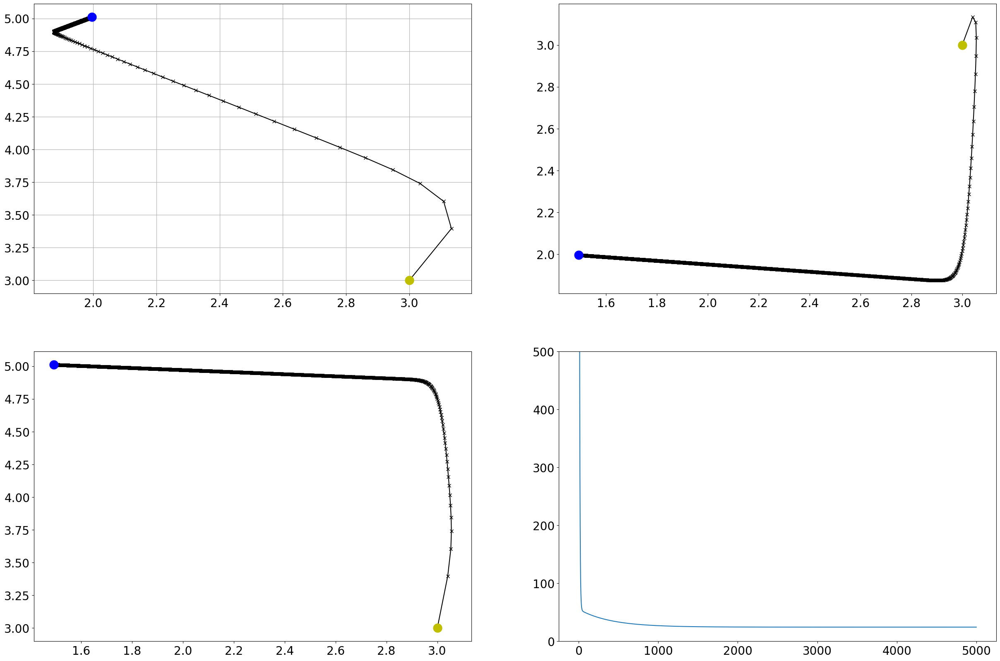

In [10]:
## Plot the results - it is a 3d parameter space - we plot 2d slices
## Green is starting point and blue is ending point
plt.figure(figsize = (30, 20))
plt.rcParams['xtick.labelsize'] = plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['legend.fontsize'] = 20
ax = plt.subplot(2, 2, 1)
plt.plot(theta_path[:, 1], theta_path[:, 2], 'k-x')
plt.plot(theta_path[0, 1], theta_path[0, 2], 'yo', markersize=15)
plt.plot(theta_path[-1, 1], theta_path[-1, 2], 'bo', markersize=15)
ax.grid(True)
plt.subplot(2, 2, 2)
plt.plot(theta_path[:, 0], theta_path[:, 1], 'k-x')
plt.plot(theta_path[0, 0], theta_path[0, 1], 'yo', markersize=15)
plt.plot(theta_path[-1, 0], theta_path[-1, 1], 'bo', markersize=15)
plt.subplot(2,2,3)
plt.plot(theta_path[:, 0], theta_path[:, 2], 'k-x')
plt.plot(theta_path[0, 0], theta_path[0, 2], 'yo', markersize=15)
plt.plot(theta_path[-1, 0], theta_path[-1, 2], 'bo', markersize=15)

plt.subplot(2, 2, 4)
plt.plot(loss_vec)
plt.ylim([0, 500])

## Plot the loss function

In [11]:
import plotly.express as px


def draw_plotly_line(x, y, theta_path=None, x_label='', y_label='', title=''):
    fig = px.line(x=x, y=y, labels={'x': x_label, 'y': y_label}, title=title,
                  custom_data=None if theta_path is None else [theta_path[1:, 0], theta_path[1:, 1], theta_path[1:, 2]])
    fig.update_traces(
        hovertemplate='<br>'.join([
            x_label[:4] + ': %{x}',
            y_label[:4] + ': %{y:0.6f}',
            'b: %{customdata[0]:0.4f}',
            'θ1: %{customdata[1]:0.4f}',
            'θ2: %{customdata[2]:0.4f}',
        ]),
        mode='lines',
        marker=dict(size=3, line=dict(width=1.2, color='cyan')),
    )
   
    fig.update_layout(
        updatemenus=[
            dict(
                type = 'buttons',
                direction = 'left',
                buttons=list([
                    dict(args=[{'mode': 'lines'}], label='Lines', method='restyle'),
                    dict(args=[{'mode': 'lines+markers'}], label='Lines + Markers', method='restyle')]),
                pad={'r': 10, 't': 10},
                showactive=True,
                x=0, xanchor='left',
                y=1.1, yanchor='top'
            ),
        ]
    )    
   
    fig.update_xaxes(range=[-500+x[0], 500+x[-1]], tickformat=',')
    fig.update_yaxes(range=[0, 500])
    fig.update_layout(width=800, height=600)
    fig['layout']['title']['font'] = dict(color='blue', size=20)
    fig.show()


draw_plotly_line(np.arange(loss_vec.shape[0]), loss_vec, theta_path,
                 'no. of weight updates', 'loss value', title='Loss Function')

## Stochastic Gradient Descent
Rather than average the gradients across the whole dataset before taking a step, we will now take a step for every datapoint.  Each step will be somewhat of an "overreaction" but they should average out.

## Exercise (Stochastic Gradient Descent)
The below code runs Stochastic Gradient descent, but runs through the data in the same order every time.  

1. Run the code and plot the graphs.  What do you notice?
1. Modify the code so that it randomly re-orders the data.  How do the sample trajectories compare? [STUDENT TO COMPLETE THIS]

In [92]:
## Parameters to play with
learning_rate = 0.01
num_iter = 1000   # The number of "steps" will be num_iter * numobs
theta_initial = np.array([3, 3, 3])

In [93]:
## Initialization steps
theta = theta_initial
theta_path = np.zeros(((num_iter*num_obs)+1, 3))
theta_path[0, :] = theta_initial
loss_vec = np.zeros(num_iter*num_obs)

In [94]:
## Main SGD loop
count = 0
for i in range(num_iter):
    """Shuffle the data"""
    # shuffled_indices = np.random.permutation(num_obs)
    for j in range(num_obs):
        count += 1
        y_pred = np.dot(theta.T, x_mat.T)
        loss_vec[count-1] = np.sum((y_pred - y)**2)
        grad_vec = (y_pred[j] - y[j])*(x_mat[j,:])
        theta = theta - learning_rate*grad_vec
        theta_path[count, :] = theta

(0.0, 500.0)

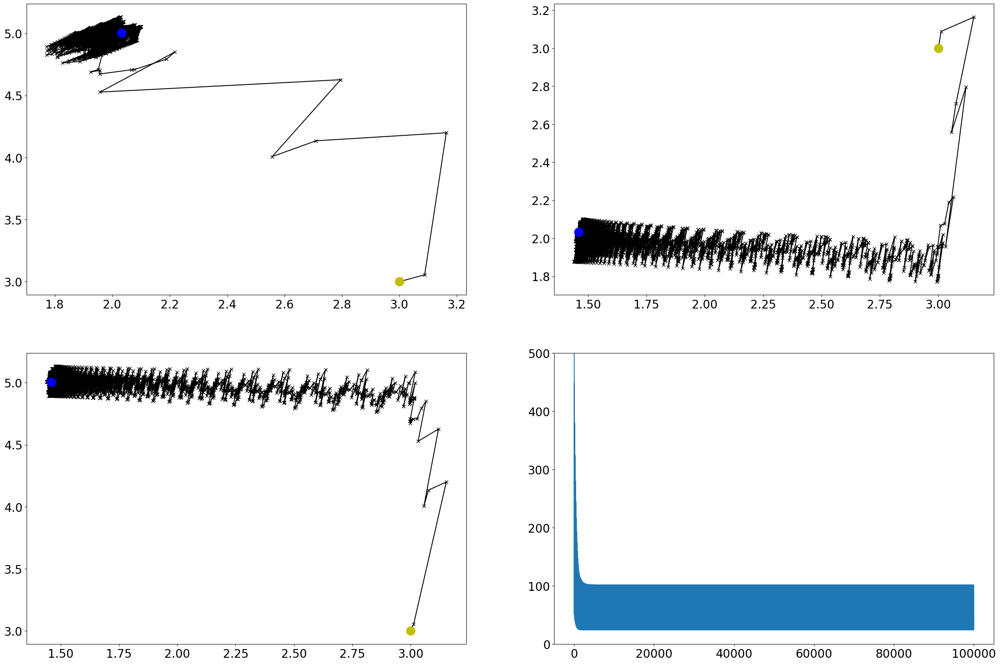

In [95]:
## Plot the results - it is a 3d parameter space - we plot 2d slices
## Green is starting point and blue is ending point
plt.figure(figsize = (30, 20))
plt.subplot(2, 2, 1)
plt.plot(theta_path[:, 1], theta_path[:, 2], 'k-x')
plt.plot(theta_path[0, 1], theta_path[0, 2], 'yo', markersize=15)
plt.plot(theta_path[-1, 1], theta_path[-1, 2], 'bo', markersize=15)
plt.subplot(2, 2, 2)
plt.plot(theta_path[:, 0], theta_path[:, 1], 'k-x')
plt.plot(theta_path[0, 0], theta_path[0, 1], 'yo', markersize=15)
plt.plot(theta_path[-1, 0], theta_path[-1, 1], 'bo', markersize=15)
plt.subplot(2,2,3)
plt.plot(theta_path[:, 0], theta_path[:, 2], 'k-x')
plt.plot(theta_path[0, 0], theta_path[0, 2], 'yo', markersize=15)
plt.plot(theta_path[-1, 0], theta_path[-1, 2], 'bo', markersize=15)

plt.subplot(2, 2, 4)
plt.plot(loss_vec)
plt.ylim([0, 500])

In [25]:
import plotly.express as px


def draw_plotly_line(x, y, theta_path=None, x_label='', y_label='', title=''):
    fig = px.line(x=x, y=y, labels={'x': x_label, 'y': y_label}, title=title,
                  custom_data=None if theta_path is None else [theta_path[1:, 0], theta_path[1:, 1], theta_path[1:, 2]])
    fig.update_traces(
        hovertemplate='<br>'.join([
            x_label[:4] + ': %{x}',
            y_label[:4] + ': %{y:0.6f}',
            'b: %{customdata[0]:0.4f}',
            'θ1: %{customdata[1]:0.4f}',
            'θ2: %{customdata[2]:0.4f}',
        ]),
        mode='lines',
        marker=dict(size=3, line=dict(width=1.2, color='cyan')),
    )
   
    fig.update_layout(
        updatemenus=[
            dict(
                type = 'buttons',
                direction = 'left',
                buttons=list([
                    dict(args=[{'mode': 'lines'}], label='Lines', method='restyle'),
                    dict(args=[{'mode': 'lines+markers'}], label='Lines + Markers', method='restyle')]),
                pad={'r': 10, 't': 10},
                showactive=True,
                x=0, xanchor='left',
                y=1.1, yanchor='top'
            ),
        ]
    )    
   
    fig.update_xaxes(range=[-500+x[0], 500+x[-1]], tickformat=',')
    fig.update_yaxes(range=[0, 500])
    fig.update_layout(width=800, height=600)
    fig['layout']['title']['font'] = dict(color='blue', size=20)
    fig.show()


draw_plotly_line(np.arange(loss_vec.shape[0]), loss_vec, theta_path,
                 'no. of weight updates', 'loss value', title='Loss Function')

In [17]:
## Student to write code below.

## Exercise (Mini Batch Gradient Descent)
The below code runs Mini Batch Gradient Descent.  

1. Pick a batch size, run the code, and then plot the trajectory of your gradient descent.
1. Observe and explain how the batch size affects the trajectory.

In [99]:
## Parameters to play with
learning_rate = 0.001
num_iter = 10000
batch_size = 1
print(f"num_obs: {num_obs}")
print(f"BATCH SIZE: {batch_size}")
print(f"NUM_ITER: {num_iter}")
steps_per_epoch = num_obs // batch_size + int(num_obs % batch_size != 0)
print(f"modular: {num_obs % batch_size != 0}")
print(f"steps_per_epoch: {steps_per_epoch}")
num_epoch = num_iter//steps_per_epoch  # The number of "steps" will be num_iter * num_obs / batch_size
print(f"num_epoch: {num_epoch}")
theta_initial = np.array([3, 3, 3])

## Initialization steps
theta = theta_initial
theta_path = np.zeros(((num_epoch*steps_per_epoch)+1, 3))
theta_path[0, :]= theta_initial
loss_vec = np.zeros(num_epoch*steps_per_epoch)

count = 0
idx = np.arange(num_obs)
for i in range(num_epoch):
    np.random.shuffle(idx)
    y     = y[idx]
    x_mat = x_mat[idx]
    for j in range(steps_per_epoch):
        count += 1
        beg = j * batch_size
        end = (j + 1) * batch_size
        y_pred = np.dot(theta.T, x_mat.T)
        loss_vec[count-1] = np.sum((y_pred - y)**2)
        grad_vec = (y_pred[beg:end] - y[beg:end]).dot(x_mat[beg:end, :])/batch_size
        theta = theta - learning_rate*grad_vec
        theta_path[count, :] = theta

num_obs: 100
BATCH SIZE: 1
NUM_ITER: 10000
modular: False
steps_per_epoch: 100
num_epoch: 100


(0.0, 500.0)

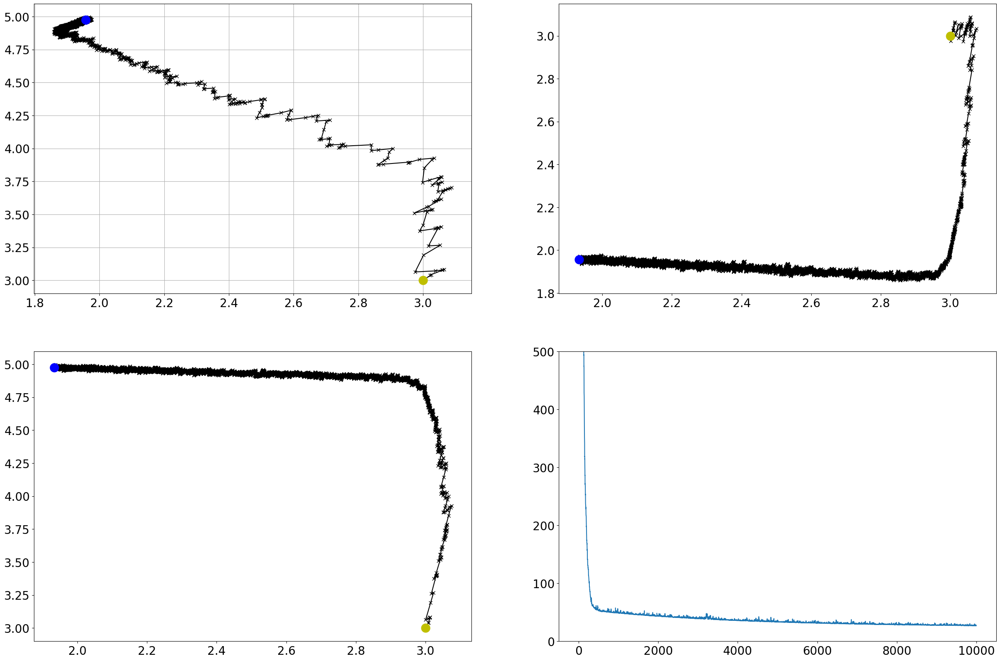

In [98]:
## Plot the results - it is a 3d parameter space - we plot 2d slices
## Green is starting point and blue is ending point
plt.figure(figsize = (30, 20))
ax = plt.subplot(2, 2, 1)
plt.plot(theta_path[:, 1], theta_path[:, 2], 'k-x')
plt.plot(theta_path[0, 1], theta_path[0, 2], 'yo', markersize=15)
plt.plot(theta_path[-1, 1], theta_path[-1, 2], 'bo', markersize=15)
ax.grid(True)
plt.subplot(2, 2, 2)
plt.plot(theta_path[:, 0], theta_path[:, 1], 'k-x')
plt.plot(theta_path[0, 0], theta_path[0, 1], 'yo', markersize=15)
plt.plot(theta_path[-1, 0], theta_path[-1, 1], 'bo', markersize=15)
plt.subplot(2,2,3)
plt.plot(theta_path[:, 0], theta_path[:, 2], 'k-x')
plt.plot(theta_path[0, 0], theta_path[0, 2], 'yo', markersize=15)
plt.plot(theta_path[-1, 0], theta_path[-1, 2], 'bo', markersize=15)

plt.subplot(2, 2, 4)
plt.plot(loss_vec)
plt.ylim([0, 500])

In [90]:
import plotly.express as px


def draw_plotly_line(x, y, theta_path=None, x_label='', y_label='', title=''):
    fig = px.line(x=x, y=y, labels={'x': x_label, 'y': y_label}, title=title,
                  custom_data=None if theta_path is None else [theta_path[1:, 0], theta_path[1:, 1], theta_path[1:, 2]])
    fig.update_traces(
        hovertemplate='<br>'.join([
            x_label[:4] + ': %{x}',
            y_label[:4] + ': %{y:0.6f}',
            'b: %{customdata[0]:0.4f}',
            'θ1: %{customdata[1]:0.4f}',
            'θ2: %{customdata[2]:0.4f}',
        ]),
        mode='lines',
        marker=dict(size=3, line=dict(width=1.2, color='cyan')),
    )
   
    fig.update_layout(
        updatemenus=[
            dict(
                type = 'buttons',
                direction = 'left',
                buttons=list([
                    dict(args=[{'mode': 'lines'}], label='Lines', method='restyle'),
                    dict(args=[{'mode': 'lines+markers'}], label='Lines + Markers', method='restyle')]),
                pad={'r': 10, 't': 10},
                showactive=True,
                x=0, xanchor='left',
                y=1.1, yanchor='top'
            ),
        ]
    )    
   
    fig.update_xaxes(range=[-500+x[0], 500+x[-1]], tickformat=',')
    fig.update_yaxes(range=[0, 500])
    fig.update_layout(width=800, height=600)
    fig['layout']['title']['font'] = dict(color='blue', size=20)
    fig.show()


draw_plotly_line(np.arange(loss_vec.shape[0]), loss_vec, theta_path,
                 'no. of weight updates', 'loss value', title='Loss Function')

# ขอให้ปรับแก้ไขโค้ดตามลักษณะของคำถาม แล้วจึงตอบคำถามต่อไปนี้
### โดยให้เพิ่ม Cell สำหรับแต่ละคำถาม เพื่อใช้เขียนโค้ดและใช้ผลประกอบคำอธิบาย

1. (Gradient Descent) หากค่า learning rate สูงหรือต่ำจนเกินไป มีผลต่อการลู่ของค่าพารามิเตอร์เข้าหาค่าที่ควรจะเป็นอย่างไร
1. (Stochastic Gradient Descent) การสลับลำดับของข้อมูลที่ใช้ในการหาค่า gradient ส่งผลต่อกราฟ loss อย่างไร
1. (Mini Batch Gradient Descent) ค่าของ batch size มีผลต่อการเทรนโมเดลอย่างไร
1. (Mini Batch Gradient Descent) จำนวน epoch ที่สูงหรือต่ำจนเกินไป มีผลต่อการเทรนโมเดลอย่างไร

### 1. (Gradient Descent) หากค่า learning rate สูงหรือต่ำจนเกินไป มีผลต่อการลู่ของค่าพารามิเตอร์เข้าหาค่าที่ควรจะเป็นอย่างไร
ตอบ เมื่อปรับค่า Learning rate ที่สูงเกินไปและต่ำเกินไป สิงที่จะได้ก็คือ ค่า Loss Function จะไม่สามารถอธิบายออกมาได้เนื่องจากค่า Learning Rate ไม่มีความเหมาะสมที่จะสามารถเรียนรู้ได้ นอกจากนี้ค่า Input ที่ได้ออกมานั้นยังเป็นการแสดงอีกว่า การ Prediction และ ค่าที่ตั้งไว้ไม่มีความใกล้เคียงกันอย่างสิ้นเชิง

### 2. (Stochastic Gradient Descent) การสลับลำดับของข้อมูลที่ใช้ในการหาค่า gradient ส่งผลต่อกราฟ loss อย่างไร
ตอบ การสลับลำดับของข้อมูลที่ใช้ในการหาค่า gradient นั้น ถ้าหากว่าไม่มีการสลับค่าข้อมูล ค่าข้อมูลจะมีการทำงานตามลำดับปกติ แต่ว่าถ้าหากว่าเรามีการสลับค่าข้อมูล(Shuffle Data) จะสามารถสังเกตได้ว่า Loss Function นั้นมี Noise ที่สูงมาก แต่เกิดที่เกิด Noise เช่นนี้ส่งผลดีที่ว่า SGD จะสามารถเลี่ยงการเกิดค่า Local Minimum ได้ ซึ่งดีกว่าการไม่สลับข้อมูล

### 3. (Mini Batch Gradient Descent) ค่าของ batch size มีผลต่อการเทรนโมเดลอย่างไร
ตอบ การปรับ Batch Size มีผลต่อการเทรนโมเดลเพราะว่า ใน Mini Batch Gradient Descent จำนวน Epoch หมายถึงการมองเห็นข้อมูลทั้งหมด ดังนั้นถ้าหากว่าใน 1 Epoch เราแบ่ง Data Set ก็คือ การแบ่งจำนวนของ Batch Size ว่าจะมีกี่จำนวนและแต่ละ Batch Size มีขนาดเท่าไร ซึ่งขนาดตรงนี้จะสามารถบอกได้ว่า ถ้าขนาดของ Batch Size มีขนาดที่เล็กจะทำให้มีการอัปเดตค่า Weight ที่เยอะขึ้นซึ่งการอัปเดตค่า Weight ที่เยอะซึ่งจะทำให้เกิด Noise ที่เยอะขึ้น แต่ก็สามารถทำให้ Model หลุดจากการเกิดปัญหาของ Local Minimum แต่ถ้าหากว่า Batch Size มีขนาดที่ใหญ่การ Update ค่า Weight ก็น้อย ซึ่งการกระทำแบบนี้จะทำให้ Model มีค่า Noise ทำให้การเทรน Model มีประสิทธิภาพ 

### 4. (Mini Batch Gradient Descent) จำนวน epoch ที่สูงหรือต่ำจนเกินไป มีผลต่อการเทรนโมเดลอย่างไร
ตอบ จำนวน Epoch ที่เยอะจนเกินไปจะส่งผลให้การเทรนโมเดลนั้นมีประสิทธิภาพของ Loss Function ที่น้อยเพราะว่ามีการวนลูปเรียนรู้ซ้ำที่เยอะซึ่งเหตุนี้อาจะให้เกิด Overfitting ได้ ส่วนจำนวน Epoch ที่น้อยเกินไปก็อาจจะทำให้การเทรนโมเดลเกิด Underfitting ได้